In [1]:
___Author___='LumberJack Jyss'

In [2]:
print('Global Optimized LumberJack Equities Method\n°OoO_FOREX_Oo0°\nLumberJack Jyss 5779(c)')

Global Optimized LumberJack Equities Method
°OoO_FOREX_Oo0°
LumberJack Jyss 5779(c)


In [3]:
print('Importing librairies...')
import numpy as np
import pandas as pd
import talib
from zigzag import *
import matplotlib.pyplot as plt
import seaborn as sns
import os
print('Librairies imported')

Importing librairies...
Librairies imported


In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
start = '2017-02-16'
end = '2019-05-28'

In [6]:
vix = pd.read_csv('vix_1h.csv')

vix = vix.iloc[:,1:-1]

In [7]:
df = pd.read_csv('spx_1h.csv')
df = df.iloc[:,1:-1]

In [8]:
vix.shape,df.shape

((7530, 5), (3506, 5))

In [9]:
a=0
while a < 7550:
    a+=1
    for i in range(0,vix.shape[0]-1):
        if vix.iloc[i,0]!= df.iloc[i,0]:
            #print('Vix :', vix.iloc[i,0],' spy : ', df.iloc[i,0])
            #print('Index Vix:', vix.index[i],' index Spy :',df.index[i])
            vix = vix.drop([i],axis=0)
            break
    vix.reset_index(inplace=True,drop=True)
    df.reset_index(inplace=True,drop=True)
    if a == 750:
        print('10%')
    if a == 750*2:
        print('20%')
    if a == 750*3:
        print('30%')
    if a == 750*4:
        print('40%')
    if a == 750*5:
        print('50%')
    if a == 750*6:
        print('60%')
    if a == 750*7:
        print('70%')
    if a == 750*8:
        print('80%')
    if a == 750*9:
        print('90%')
print('Done')

10%


KeyboardInterrupt: 

In [ ]:
vix.shape,df.shape

In [ ]:
vix = vix.iloc[:-1,:]

In [ ]:
vix.head()

In [13]:
df.head()

,Date,Open,High,Low,Close
0,20170601 15:30:00,2415.65,2418.10,2413.54,2416.49
1,20170601 16:00:00,2416.48,2417.37,2413.96,2415.27
2,20170601 17:00:00,2415.15,2420.29,2414.94,2420.12
3,20170601 18:00:00,2420.13,2423.86,2420.11,2423.55
4,20170601 19:00:00,2423.53,2426.07,2423.44,2425.10


In [14]:
vix.shape,df.shape

((3506, 5), (3506, 5))

In [15]:
vix.tail()

,Date,Open,High,Low,Close
3501,20190531 17:00:00,18.44,18.49,18.01,18.22
3502,20190531 18:00:00,18.24,18.69,18.20,18.60
3503,20190531 19:00:00,18.61,18.65,18.28,18.30
3504,20190531 20:00:00,18.28,18.92,18.28,18.43
3505,20190531 21:00:00,18.44,18.90,18.39,18.71


In [16]:
df.tail()

,Date,Open,High,Low,Close
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08


In [17]:
vix.to_csv('vix1H.csv')

In [10]:
vix = pd.read_csv('vix1H.csv')
vix = vix.iloc[:,1:]
vix.head(0)

,Date,Open,High,Low,Close


In [11]:
delta = round(df.shape[0])
bloc1 = round(delta*0.8)
bloc2 = delta - bloc1
print("Period of study : ",delta)
print(' 80% - 20% de la période : ')
print('Bloc 1 : ',bloc1,' periods \nBloc 2 :',bloc2,' periods')

Period of study :  3506
 80% - 20% de la période : 
Bloc 1 :  2805  periods 
Bloc 2 : 701  periods


In [12]:
dataset_1H = df.copy()
dataset_1H['Vix'] = vix['Close']
dataset_1H.head()

,Date,Open,High,Low,Close,Vix
0,20170601 15:30:00,2415.65,2418.10,2413.54,2416.49,10.37
1,20170601 16:00:00,2416.48,2417.37,2413.96,2415.27,10.45
2,20170601 17:00:00,2415.15,2420.29,2414.94,2420.12,10.23
3,20170601 18:00:00,2420.13,2423.86,2420.11,2423.55,10.27
4,20170601 19:00:00,2423.53,2426.07,2423.44,2425.10,10.13


In [13]:
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71


In [14]:
rsi = talib.RSI(dataset_1H['Close'],timeperiod=14)
upper, middle, lower =  talib.BBANDS(dataset_1H['Close'], timeperiod=9, nbdevup=2, nbdevdn=2,matype=0)
sma5 = talib.SMA(dataset_1H['Close'],timeperiod=5)
sma8 = talib.SMA(dataset_1H['Close'],timeperiod=8)
sma10 = talib.SMA(dataset_1H['Close'],timeperiod=10)
sma12 = talib.SMA(dataset_1H['Close'],timeperiod=12)
sma15 = talib.SMA(dataset_1H['Close'],timeperiod=15)
sma30 = talib.SMA(dataset_1H['Close'],timeperiod=30)
sma35 = talib.SMA(dataset_1H['Close'],timeperiod=35)
sma40 = talib.SMA(dataset_1H['Close'],timeperiod=40)
sma45 = talib.SMA(dataset_1H['Close'],timeperiod=45)
sma50 = talib.SMA(dataset_1H['Close'],timeperiod=50)

delta5_8 = sma5 - sma8
delta8_10 = sma8 - sma10
delta10_12 = sma10 - sma12
delta12_15 = sma12 - sma15
delta15_30 = sma15 - sma30
delta30_35 = sma30 - sma35
delta35_40 = sma35 - sma40
delta40_45 = sma40 - sma45
delta45_50 = sma45 - sma50

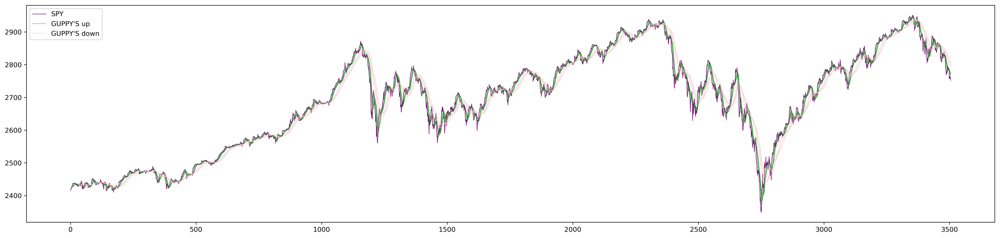

In [15]:
plt.figure(figsize=(26,6),dpi=300)
plt.plot(dataset_1H['Close'],label = 'SPY',color='purple',lw=0.7)
plt.plot(sma5,label = "GUPPY'S up", color='g', alpha=0.7,lw=0.5)
plt.plot(sma10, color='g', alpha=0.7,lw=0.5)
plt.plot(sma10, color='g', alpha=0.7,lw=0.5)
plt.plot(sma12, color='g', alpha=0.7,lw=0.5)
plt.plot(sma15, color='g', alpha=0.7,lw=0.5)
plt.plot(sma30, label = "GUPPY'S down", color='pink', alpha=0.7,lw=0.5)
plt.plot(sma35, color='pink', alpha=0.7,lw=0.5)
plt.plot(sma40, color='pink', alpha=0.7,lw=0.5)
plt.plot(sma45, color='pink', alpha=0.7,lw=0.5)
plt.plot(sma50, color='pink', alpha=0.7,lw=0.5)
plt.legend()
plt.show()

In [16]:
delta5_8.shape,delta8_10.shape, delta10_12.shape, delta12_15.shape, delta15_30 .shape,delta30_35.shape,delta35_40.shape,delta40_45.shape, delta45_50.shape

((3506,),
 (3506,),
 (3506,),
 (3506,),
 (3506,),
 (3506,),
 (3506,),
 (3506,),
 (3506,))

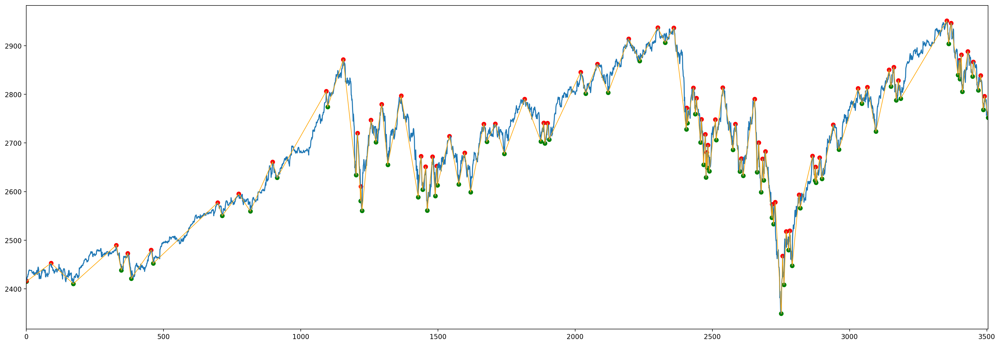

In [17]:
X = dataset_1H['Close']
pivots = peak_valley_pivots(X.values, 0.01, -0.01)
ts_pivots = pd.Series(X, index=X.index)
ts_pivots_up = ts_pivots[pivots == -1]
ts_pivots_down = ts_pivots[pivots == 1]
ts_pivots_all = ts_pivots[pivots!=0]

plt.figure(figsize=(26,9),dpi=200)
X.plot()
#ts_pivots_up.plot(style='g-o',lw=0.8,alpha=0.8)
ts_pivots_all.plot(color='orange',lw=0.9)
plt.scatter(x=ts_pivots_up.index,y=ts_pivots_up[:],c='g')
plt.scatter(x=ts_pivots_down.index,y=ts_pivots_down[:],c='r')
plt.show()
plt.close()

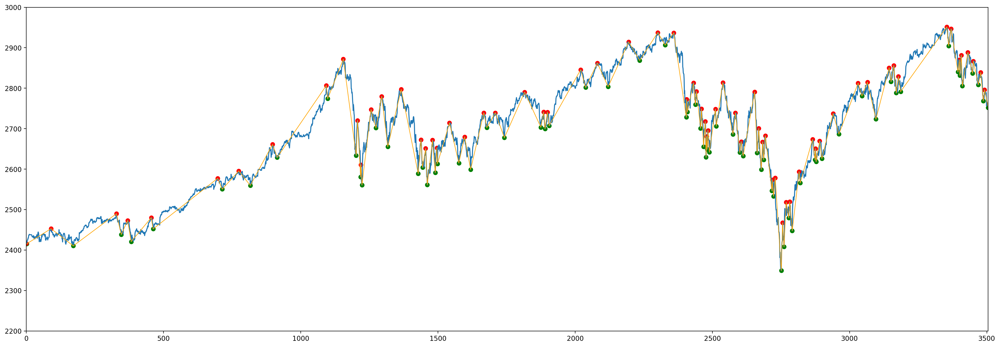

In [18]:
plt.figure(figsize=(26,9),dpi=200)
plt.xlim((5100,6500))
plt.ylim((2200,3000))
plt.plot(X)
#ts_pivots_up.plot(style='g-o',lw=0.8,alpha=0.8)
ts_pivots_all.plot(color='orange',lw=0.9)
plt.scatter(x=ts_pivots_up.index,y=ts_pivots_up[:],c='g')
plt.scatter(x=ts_pivots_down.index,y=ts_pivots_down[:],c='r')
plt.show()
plt.close()

peak = []
valley = []

for i in range(0,dataset_1H.shape[0]):
    if pivots[i] == 1:
        peak.append(pivots[i])
        valley.append(0)
    elif pivots[i] == -1:
        peak.append(0)
        valley.append(pivots[i])
    else:
        peak.append(0)
        valley.append(0)
        

In [19]:
ts_pivots_up.index

Int64Index([   1,  171,  346,  382,  462,  714,  816,  914, 1098, 1202, 1218,
            1223, 1274, 1317, 1428, 1444, 1461, 1490, 1498, 1576, 1619, 1678,
            1742, 1875, 1890, 1905, 2038, 2120, 2235, 2328, 2405, 2409, 2438,
            2457, 2468, 2477, 2481, 2489, 2514, 2575, 2600, 2612, 2663, 2678,
            2687, 2717, 2723, 2751, 2761, 2778, 2791, 2820, 2874, 2878, 2899,
            2961, 3045, 3096, 3151, 3170, 3186, 3361, 3395, 3402, 3411, 3448,
            3469, 3487, 3505],
           dtype='int64')

In [20]:
len(pivots),len(peak),len(valley),sum(peak),sum(valley)

(3506, 3506, 3506, 69, -69)

In [21]:
bbdelta = upper - middle
price_bolup = dataset_1H['Close'] - lower
price_bolow = dataset_1H['Close'] - upper

In [22]:
ts_pivots.shape,bbdelta.shape,price_bolup.shape,price_bolow.shape

((3506,), (3506,), (3506,), (3506,))

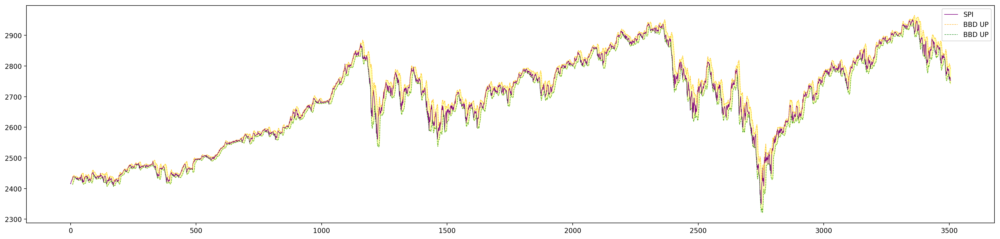

In [23]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['Close'],label = 'SPI',color='purple',lw=0.8)
plt.plot(upper,label='BBD UP',color = 'orange',linestyle='--',lw=0.7,alpha=0.8)
plt.plot(lower,label='BBD UP',color = 'green',linestyle='--',lw=0.7,alpha=0.8)
plt.fill_between(x=dataset_1H.index,y1=upper,y2=lower,color='yellow',alpha=0.3)
plt.legend()
plt.show()

In [24]:
rsi25_list = []
rsi75_list = []
for i in range(0,dataset_1H.shape[0]):
    rsi75_list.append(75 - rsi[i])
    rsi25_list.append(rsi[i] - 25)

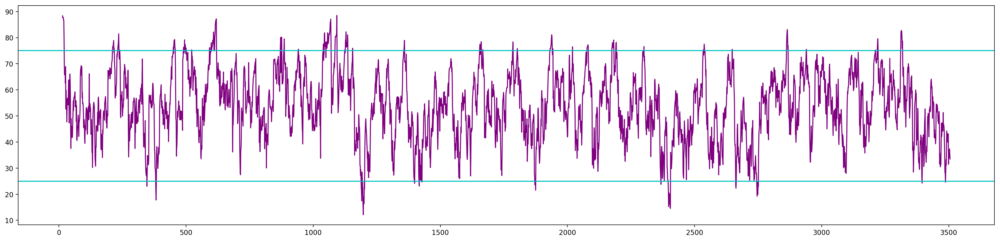

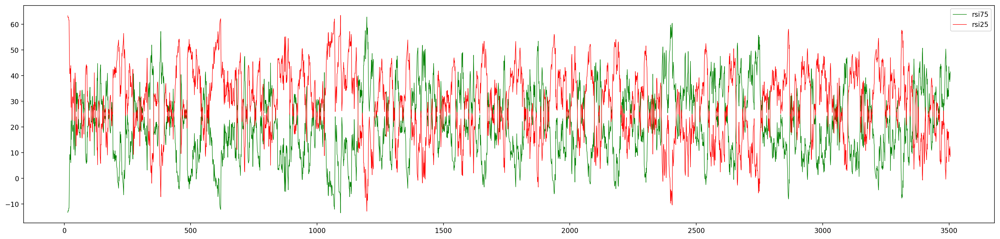

In [25]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(rsi,label = 'RSI',color='purple')
plt.axhline(y=75,color='c')
plt.axhline(y=25,color='c')

plt.figure(figsize=(26,6),dpi=200)
plt.plot(rsi75_list,label='rsi75',color='green',lw=0.7)
plt.plot(rsi25_list,label='rsi25',color='r',lw=0.7)

plt.legend()
plt.show()

In [26]:
varop_spy = dataset_1H['Open'] - dataset_1H['Close']
varhl_spy = dataset_1H['High'] - dataset_1H['Low']
varop_vix = vix['Open'] - vix['Close']
varhl_vix = vix['High'] - vix['Low']

In [27]:
varop_spy.shape,varhl_spy.shape,varop_vix.shape,varhl_vix.shape

((3506,), (3506,), (3506,), (3506,))

In [28]:
dataset_1H['Varop_Spy'] = varop_spy
dataset_1H['Varhl_spy'] = varhl_spy
dataset_1H['Varop_vix'] = varop_vix
dataset_1H['Varhl_vix'] = varhl_vix
dataset_1H['RSI'] = rsi
dataset_1H['75 - RSI'] = np.array(rsi75_list)
dataset_1H['RSI - 25'] = np.array(rsi25_list)

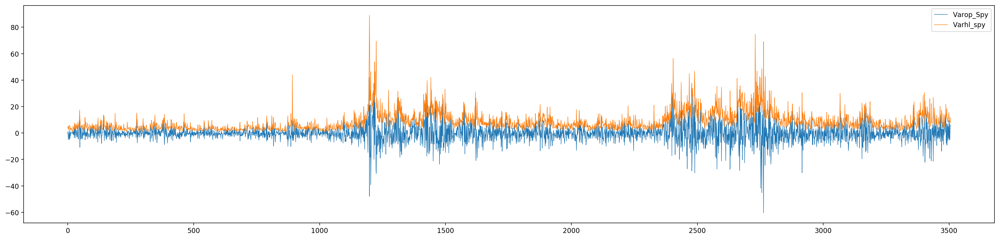

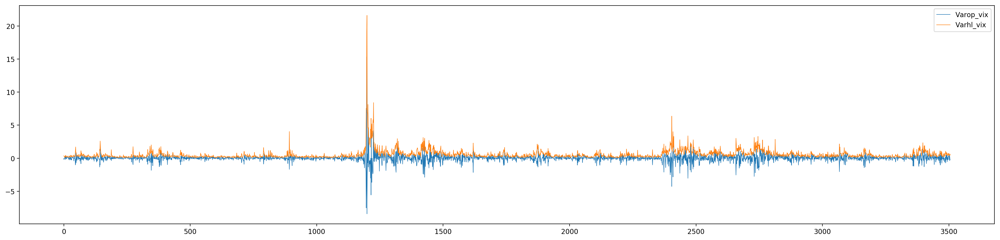

In [29]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['Varop_Spy'],label = 'Varop_Spy',lw=0.7)
plt.plot(dataset_1H['Varhl_spy'],label = 'Varhl_spy',lw=0.7)
plt.legend()


plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['Varop_vix'],label = 'Varop_vix',lw=0.7)
plt.plot(dataset_1H['Varhl_vix'],label = 'Varhl_vix',lw=0.7)
plt.legend()
plt.show()

In [30]:
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,RSI,75 - RSI,RSI - 25
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,36.552416,38.447584,11.552416
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,34.118378,40.881622,9.118378
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,37.343529,37.656471,12.343529
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,35.638711,39.361289,10.638711
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,33.494537,41.505463,8.494537


In [31]:
dataset_1H['BBD_Delta_Up'] = bbdelta

dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,RSI,75 - RSI,RSI - 25,BBD_Delta_Up
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,36.552416,38.447584,11.552416,25.644578
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,34.118378,40.881622,9.118378,27.404793
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,37.343529,37.656471,12.343529,27.320792
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,35.638711,39.361289,10.638711,25.221335
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,33.494537,41.505463,8.494537,24.112489


In [32]:
dataset_1H['delta5_8'] = delta5_8
dataset_1H['delta8_10'] = delta8_10
dataset_1H['delta10_12'] = delta10_12
dataset_1H['delta12_15'] = delta12_15
dataset_1H['delta15_30'] = delta15_30
dataset_1H['delta30_35'] = delta30_35
dataset_1H['delta35_40'] = delta35_40
dataset_1H['delta40_45'] = delta40_45
dataset_1H['delta45_50'] = delta45_50

In [33]:
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,...,BBD_Delta_Up,delta5_8,delta8_10,delta10_12,delta12_15,delta15_30,delta30_35,delta35_40,delta40_45,delta45_50
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,...,25.644578,-6.05675,-3.09325,0.325333,1.184000,-20.455000,-2.544905,-4.122429,-5.710778,-5.254622
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,...,27.404793,-8.01975,-2.70125,-2.158333,0.536667,-18.999667,-3.249381,-2.988536,-6.031083,-5.470267
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,...,27.320792,-9.64475,-3.55725,-3.143167,-0.443500,-17.562667,-3.988952,-2.041964,-6.297972,-5.502178
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,...,25.221335,-5.84050,-4.31650,-2.693500,-2.084167,-16.598000,-5.032476,-1.957107,-5.588639,-5.564511
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,...,24.112489,-3.61450,-4.50750,-3.474167,-3.745833,-15.466333,-5.621095,-2.126571,-5.153778,-5.561822


In [34]:
spread = dataset_1H['Close'] - dataset_1H['Vix']
dataset_1H['Spread'] = spread
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,...,delta5_8,delta8_10,delta10_12,delta12_15,delta15_30,delta30_35,delta35_40,delta40_45,delta45_50,Spread
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,...,-6.05675,-3.09325,0.325333,1.184000,-20.455000,-2.544905,-4.122429,-5.710778,-5.254622,2746.99
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,...,-8.01975,-2.70125,-2.158333,0.536667,-18.999667,-3.249381,-2.988536,-6.031083,-5.470267,2739.24
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,...,-9.64475,-3.55725,-3.143167,-0.443500,-17.562667,-3.988952,-2.041964,-6.297972,-5.502178,2744.83
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,...,-5.84050,-4.31650,-2.693500,-2.084167,-16.598000,-5.032476,-1.957107,-5.588639,-5.564511,2739.90
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,...,-3.61450,-4.50750,-3.474167,-3.745833,-15.466333,-5.621095,-2.126571,-5.153778,-5.561822,2733.37


In [35]:
len(peak),len(valley),len(ts_pivots)

(3506, 3506, 3506)

In [36]:
modes = pivots_to_modes(pivots)
pd.Series(X).pct_change().groupby(modes).describe().unstack()

count  -1    1139.000000
        1    2366.000000
mean   -1      -0.001558
        1       0.000812
std    -1       0.003634
        1       0.002554
min    -1      -0.023487
        1      -0.009527
25%    -1      -0.002965
        1      -0.000446
50%    -1      -0.000928
        1       0.000421
75%    -1       0.000551
        1       0.001566
max    -1       0.007977
        1       0.024938
dtype: float64

In [37]:
compute_segment_returns(X, pivots).sum()

0.0

In [38]:

max_drawdown(np.array(X))

0.2003526724469545

In [39]:
dataset_1H['Peaks'] = abs(np.array(peak))
dataset_1H['Valley'] = abs(np.array(valley))
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,...,delta10_12,delta12_15,delta15_30,delta30_35,delta35_40,delta40_45,delta45_50,Spread,Peaks,Valley
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,...,0.325333,1.184000,-20.455000,-2.544905,-4.122429,-5.710778,-5.254622,2746.99,0,0
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,...,-2.158333,0.536667,-18.999667,-3.249381,-2.988536,-6.031083,-5.470267,2739.24,0,0
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,...,-3.143167,-0.443500,-17.562667,-3.988952,-2.041964,-6.297972,-5.502178,2744.83,0,0
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,...,-2.693500,-2.084167,-16.598000,-5.032476,-1.957107,-5.588639,-5.564511,2739.90,0,0
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,...,-3.474167,-3.745833,-15.466333,-5.621095,-2.126571,-5.153778,-5.561822,2733.37,0,1


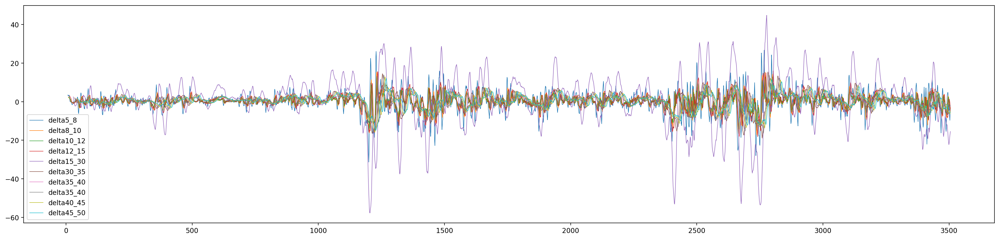

In [40]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['delta5_8'],label = 'delta5_8',lw=0.7)
plt.plot(dataset_1H['delta8_10'],label = 'delta8_10',lw=0.7)
plt.plot(dataset_1H['delta10_12'],label = 'delta10_12',lw=0.7)
plt.plot(dataset_1H['delta12_15'],label = 'delta12_15',lw=0.7)
plt.plot(dataset_1H['delta15_30'],label = 'delta15_30',lw=0.7)
plt.plot(dataset_1H['delta30_35'],label = 'delta30_35',lw=0.7)
plt.plot(dataset_1H['delta35_40'],label = 'delta35_40',lw=0.7)
plt.plot(dataset_1H['delta35_40'],label = 'delta35_40',lw=0.7)
plt.plot(dataset_1H['delta40_45'],label = 'delta40_45',lw=0.7)
plt.plot(dataset_1H['delta45_50'],label = 'delta45_50',lw=0.7)
plt.legend()

delta_1_2 = []
delta_1_3 =[]
delta_2_3 = []

delta_1_2.append(0)
delta_1_3.append(0)

delta_2_3.append(0)



for i in range(1,dataset_1D.shape[0]-1):
    delta_1_2.append(dataset_1D.iloc[-i,4] - dataset_1D.iloc[-i-1,4])
        
for i in range(1,dataset_1D.shape[0]-2):
     delta_1_3.append(dataset_1D.iloc[-i,4] - dataset_1D.iloc[-i-2,4])
    
for i in range(1,dataset_1D.shape[0]-2):
     delta_2_3.append(dataset_1D.iloc[-i-1,4] - dataset_1D.iloc[-i-2,4])

delta_1_2.append(0)
delta_1_3.append(0)
delta_2_3.append(0)
delta_1_3.append(0)
delta_2_3.append(0)


len(delta_1_2),len(delta_1_3),len(delta_2_3)

dataset_1D['delta_1_2'] = delta_1_2
dataset_1D['delta_2_3'] = delta_2_3
dataset_1D['delta_1_3'] = delta_1_3

In [41]:
dataset_1H.tail()

,Date,Open,High,Low,Close,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,...,delta10_12,delta12_15,delta15_30,delta30_35,delta35_40,delta40_45,delta45_50,Spread,Peaks,Valley
3501,20190531 17:00:00,2761.40,2768.98,2760.15,2765.21,18.22,-3.81,8.83,0.22,0.48,...,0.325333,1.184000,-20.455000,-2.544905,-4.122429,-5.710778,-5.254622,2746.99,0,0
3502,20190531 18:00:00,2765.19,2765.39,2756.32,2757.84,18.60,7.35,9.07,-0.36,0.49,...,-2.158333,0.536667,-18.999667,-3.249381,-2.988536,-6.031083,-5.470267,2739.24,0,0
3503,20190531 19:00:00,2757.83,2764.36,2756.98,2763.13,18.30,-5.30,7.38,0.31,0.37,...,-3.143167,-0.443500,-17.562667,-3.988952,-2.041964,-6.297972,-5.502178,2744.83,0,0
3504,20190531 20:00:00,2763.17,2763.87,2751.90,2758.33,18.43,4.84,11.97,-0.15,0.64,...,-2.693500,-2.084167,-16.598000,-5.032476,-1.957107,-5.588639,-5.564511,2739.90,0,0
3505,20190531 21:00:00,2758.24,2758.45,2750.52,2752.08,18.71,6.16,7.93,-0.27,0.51,...,-3.474167,-3.745833,-15.466333,-5.621095,-2.126571,-5.153778,-5.561822,2733.37,0,1


In [42]:
tsf = talib.TSF(dataset_1H['Close'],timeperiod=14)
type(tsf),len(tsf)

(pandas.core.series.Series, 3506)

In [43]:
delta_tsf = dataset_1H['Close'] - tsf
dataset_1H['delta_tsf'] = tsf
delta_tsf.shape

(3506,)

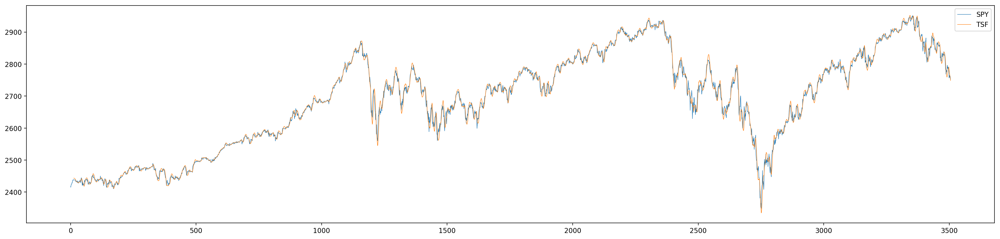

In [44]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['Close'],label = 'SPY',lw=0.6)
#plt.plot(dataset_1D['delta_tsf'],label = 'DELTA TSF SPY')
plt.plot(tsf,label='TSF',lw=0.6)
plt.legend()
plt.show()

In [45]:
forosc = []
forosc.append(0)
for i in range(1,dataset_1H.shape[0]):
    forosc.append((dataset_1H.iloc[i,4] - tsf[i-1])*100/dataset_1H.iloc[i,4])
len(forosc),type(forosc)

(3506, list)

In [46]:
dataset_1H['Forcast Oscillator'] = (forosc)

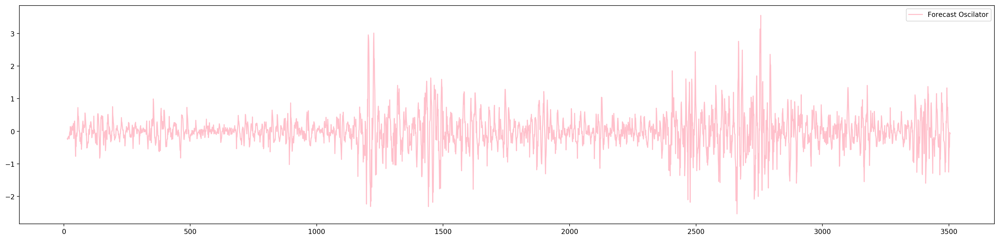

In [47]:
plt.figure(figsize=(26,6),dpi=200)
#plt.plot(dataset_1D['Close'],label = 'SPY')
#plt.plot(dataset_1D['delta_tsf'],label = 'DELTA TSF SPY')
plt.plot(dataset_1H['Forcast Oscillator'],label='Forecast Oscilator',color='pink')
plt.legend()
plt.show()

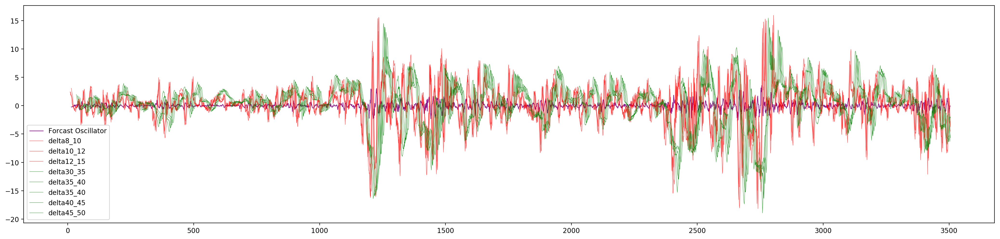

In [48]:
plt.figure(figsize=(26,6),dpi=200)
plt.plot(dataset_1H['Forcast Oscillator'],label = 'Forcast Oscillator',lw=0.9,color='purple',alpha=0.9)
#plt.plot(dataset_1H['delta5_8'],label = 'delta5_8',lw=0.6,color='r',alpha=0.6)
plt.plot(dataset_1H['delta8_10'],label = 'delta8_10',lw=0.6,color='r',alpha=0.6)
plt.plot(dataset_1H['delta10_12'],label = 'delta10_12',lw=0.6,color='r',alpha=0.6)
plt.plot(dataset_1H['delta12_15'],label = 'delta12_15',lw=0.6,color='r',alpha=0.6)
#plt.plot(dataset_1H['delta15_30'],label = 'delta15_30',lw=0.6,color='r',alpha=0.6)
plt.plot(dataset_1H['delta30_35'],label = 'delta30_35',lw=0.6,color='g',alpha=0.6)
plt.plot(dataset_1H['delta35_40'],label = 'delta35_40',lw=0.6,color='g',alpha=0.6)
plt.plot(dataset_1H['delta35_40'],label = 'delta35_40',lw=0.6,color='g',alpha=0.6)
plt.plot(dataset_1H['delta40_45'],label = 'delta40_45',lw=0.6,color='g',alpha=0.6)
plt.plot(dataset_1H['delta45_50'],label = 'delta45_50',lw=0.6,color='g',alpha=0.6)
plt.legend()

In [49]:
dataset_1H.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3506 entries, 0 to 3505
Data columns (total 28 columns):
Date                  3506 non-null object
Open                  3506 non-null float64
High                  3506 non-null float64
Low                   3506 non-null float64
Close                 3506 non-null float64
Vix                   3506 non-null float64
Varop_Spy             3506 non-null float64
Varhl_spy             3506 non-null float64
Varop_vix             3506 non-null float64
Varhl_vix             3506 non-null float64
RSI                   3492 non-null float64
75 - RSI              3492 non-null float64
RSI - 25              3492 non-null float64
BBD_Delta_Up          3498 non-null float64
delta5_8              3499 non-null float64
delta8_10             3497 non-null float64
delta10_12            3495 non-null float64
delta12_15            3492 non-null float64
delta15_30            3477 non-null float64
delta30_35            3472 non-null float64
delta35_40    

In [50]:
df.head(0)

,Date,Open,High,Low,Close


In [51]:
target_up = []
target_down = []

for i in range(0,dataset_1H.shape[0]-5):
    
    if (dataset_1H.iloc[i+1,6] * dataset_1H.iloc[i,6]) < 0 :
        if (dataset_1H.iloc[i+1,4] - dataset_1H.iloc[i,4]) > 7 : #or (df.iloc[i+1,4] - df.iloc[i,3]) > 30:
            target_up.append(1)
            target_down.append(0)
        elif (dataset_1H.iloc[i+1,4] - dataset_1H.iloc[i,4]) < -7 : #or (df.iloc[i+1,4] - df.iloc[i,2]) < -30:
            target_up.append(0)
            target_down.append(1)
        else:
            target_up.append(0)
            target_down.append(0)
    else :
        target_up.append(0)
        target_down.append(0) 
        
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)



target_up = []
target_down = []

for i in range(0,dataset_1D.shape[0]-5):
    
    if (dataset_1D.iloc[i+1,7]*dataset_1D.iloc[i,7]) < 0 :
    
        if (dataset_1D.iloc[i+5,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] > 0.02 or \
        (dataset_1D.iloc[i+4,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] > 0.03 or \
        (dataset_1D.iloc[i+3,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] > 0.04 or \
        (dataset_1D.iloc[i+2,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] > 0.05 or \
        (dataset_1D.iloc[i+1,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] > 0.06 :
            target_up.append(1)
            target_down.append(0)
        elif (dataset_1D.iloc[i+5,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] < -0.02 or \
        (dataset_1D.iloc[i+4,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] < -0.03 or \
        (dataset_1D.iloc[i+3,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] < -0.04 or \
        (dataset_1D.iloc[i+2,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] < -0.05 or \
        (dataset_1D.iloc[i+1,4] - dataset_1D.iloc[i,4])/dataset_1D.iloc[i,4] < -0.06 :
            target_up.append(0)
            target_down.append(1)
        else:
            target_up.append(0)
            target_down.append(0)
    else :
        target_up.append(0)
        target_down.append(0) 
        
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)
target_up.append(0)
target_down.append(0)



In [52]:
len(target_up),len(target_down),sum(target_up),sum(target_down)

(3506, 3506, 206, 190)

In [53]:
dataset_1H['target_up'] = target_up
dataset_1H['target_down'] = target_down

dataset_1H['target_up'].sum(),dataset_1H['target_down'].sum()

(206, 190)

In [54]:
dataset_1H['target_value'] = dataset_1H['Close']
dataset_1H = dataset_1H.drop(['Open','High','Low','Close'],axis=1)

In [55]:
dataset_1H.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3506 entries, 0 to 3505
Data columns (total 27 columns):
Date                  3506 non-null object
Vix                   3506 non-null float64
Varop_Spy             3506 non-null float64
Varhl_spy             3506 non-null float64
Varop_vix             3506 non-null float64
Varhl_vix             3506 non-null float64
RSI                   3492 non-null float64
75 - RSI              3492 non-null float64
RSI - 25              3492 non-null float64
BBD_Delta_Up          3498 non-null float64
delta5_8              3499 non-null float64
delta8_10             3497 non-null float64
delta10_12            3495 non-null float64
delta12_15            3492 non-null float64
delta15_30            3477 non-null float64
delta30_35            3472 non-null float64
delta35_40            3467 non-null float64
delta40_45            3462 non-null float64
delta45_50            3457 non-null float64
Spread                3506 non-null float64
Peaks         

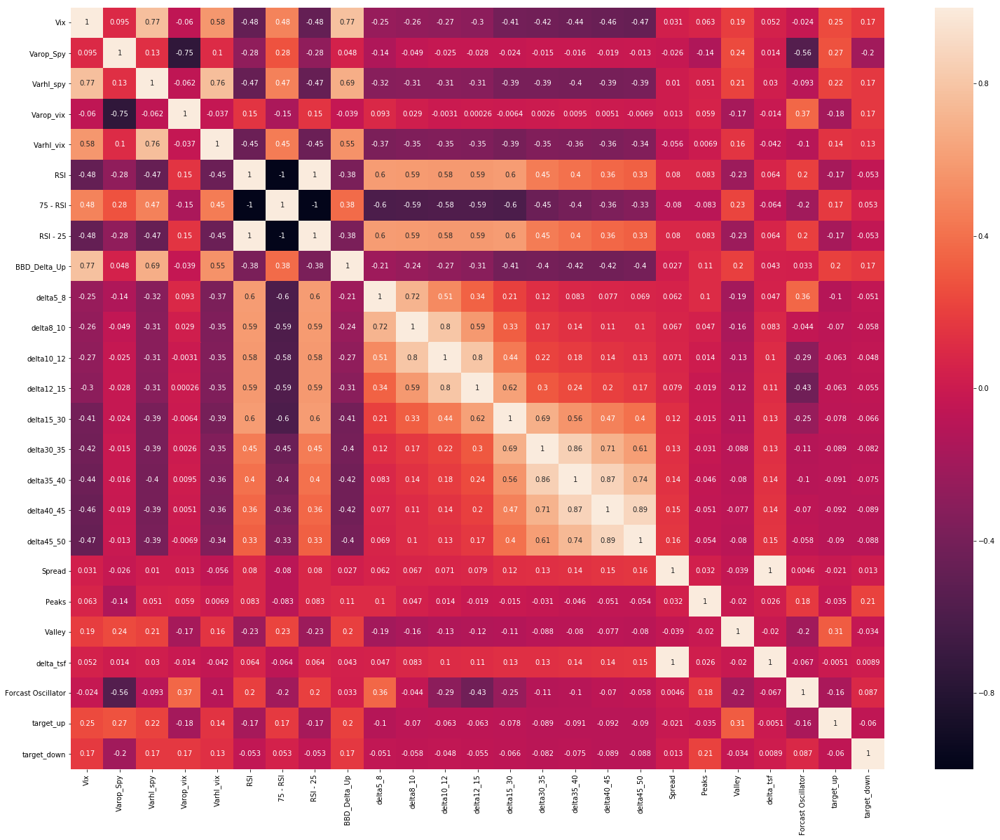

In [56]:
plt.figure(figsize=(26,20))
sns.heatmap(dataset_1H.iloc[:,:-1].corr(),annot=True)
plt.show()

In [57]:
dataset_1H.tail()

,Date,Vix,Varop_Spy,Varhl_spy,Varop_vix,Varhl_vix,RSI,75 - RSI,RSI - 25,BBD_Delta_Up,...,delta40_45,delta45_50,Spread,Peaks,Valley,delta_tsf,Forcast Oscillator,target_up,target_down,target_value
3501,20190531 17:00:00,18.22,-3.81,8.83,0.22,0.48,36.552416,38.447584,11.552416,25.644578,...,-5.710778,-5.254622,2746.99,0,0,2771.533077,-0.455383,0,0,2765.21
3502,20190531 18:00:00,18.60,7.35,9.07,-0.36,0.49,34.118378,40.881622,9.118378,27.404793,...,-6.031083,-5.470267,2739.24,0,0,2764.136374,-0.496515,0,0,2757.84
3503,20190531 19:00:00,18.30,-5.30,7.38,0.31,0.37,37.343529,37.656471,12.343529,27.320792,...,-6.297972,-5.502178,2744.83,0,0,2760.114066,-0.036422,0,0,2763.13
3504,20190531 20:00:00,18.43,4.84,11.97,-0.15,0.64,35.638711,39.361289,10.638711,25.221335,...,-5.588639,-5.564511,2739.90,0,0,2754.082747,-0.064679,0,0,2758.33
3505,20190531 21:00:00,18.71,6.16,7.93,-0.27,0.51,33.494537,41.505463,8.494537,24.112489,...,-5.153778,-5.561822,2733.37,0,1,2748.370879,-0.072772,0,0,2752.08


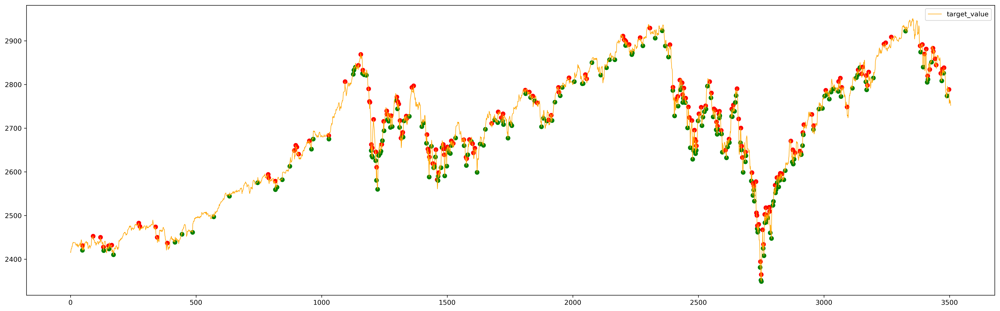

In [58]:
plt.figure(figsize=(26,8),dpi=300)
plt.plot(dataset_1H['target_value'],color='orange',lw=0.8)
for i in range(0,len(dataset_1H)):
    if dataset_1H.iloc[i,-3] == 1:
        plt.scatter(x=dataset_1H.index[i],y=dataset_1H.iloc[i,-1],c='g',marker='o')
    elif dataset_1H.iloc[i,-2] == 1:
        plt.scatter(x=dataset_1H.index[i],y=dataset_1H.iloc[i,-1],c='r',marker='o')
plt.legend()

In [59]:
sum(target_up),sum(target_down),bloc1,bloc2,(bloc2/4)/24

(206, 190, 2805, 701, 7.302083333333333)

In [60]:
dataset_1H.to_csv('20190603 data prepared.csv')